In [5]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras.layers as layers
import tensorflow.keras.models as models
from keras import optimizers
from keras.utils import load_img, img_to_array
from sklearn.model_selection import train_test_split
from keras.utils import load_img, img_to_array

In [6]:
# Vérifier le GPU
print("GPU disponible:", tf.config.list_physical_devices('GPU'))

# Exploitation des données
data_dir = '/kaggle/input/'
print("Contenu du dossier:", os.listdir(data_dir))

GPU disponible: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
Contenu du dossier: ['microsoft-catsvsdogs-dataset']


In [7]:
# Explorer la structure
for root, dirs, files in os.walk(data_dir):
    level = root.replace(data_dir, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    subindent = ' ' * 2 * (level + 1)
    if len(files) > 0:
        print(f"{subindent}{len(files)} fichiers")


# Chemins des données
data_dir = '/kaggle/input/microsoft-catsvsdogs-dataset'
pet_images_dir = os.path.join(data_dir, 'PetImages')
print("Contenu du dossier:", os.listdir(data_dir))

# Dossier des chats
cats_dir = os.path.join(pet_images_dir, 'Cat')  
# Dossier des chiens  
dogs_dir = os.path.join(pet_images_dir, 'Dog') 

print("Chemin d'accès des chats :", cats_dir)
print("Chemin d'accès des chiens :", dogs_dir)

/
microsoft-catsvsdogs-dataset/
  2 fichiers
  PetImages/
    Dog/
      12501 fichiers
    Cat/
      12501 fichiers
Contenu du dossier: ['PetImages', 'readme[1].txt', 'MSR-LA - 3467.docx']
Chemin d'accès des chats : /kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Cat
Chemin d'accès des chiens : /kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog


# FONCTIONS

In [28]:
# Fonction pour charger les données
def charger_donnees(pet_images_dir):
    tous_fichiers = []
    categories = []
    
    # Dossier des chats
    cats_dir = os.path.join(pet_images_dir, 'Cat')
    print(f"Chargement des chats depuis: {cats_dir}")
    cat_files = os.listdir(cats_dir)
    for filename in cat_files:
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            tous_fichiers.append(os.path.join(cats_dir, filename))
            categories.append(0)  # 0 pour chat
    
    # Dossier des chiens
    dogs_dir = os.path.join(pet_images_dir, 'Dog')
    print(f"Chargement des chiens depuis: {dogs_dir}")
    dog_files = os.listdir(dogs_dir)
    for filename in dog_files:
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            tous_fichiers.append(os.path.join(dogs_dir, filename))
            categories.append(1)  # 1 pour chien
    
    return tous_fichiers, categories


# Sélectionner aléatoirement 10 images de chats et de chiens
def selectionner_images_aleatoire(df, n): 
    chats_df = df[df['category'] == 0].sample(n=n, random_state=42)
    chiens_df = df[df['category'] == 1].sample(n=n, random_state=42)
    
    # Combiner les deux DataFrames
    df_final = pd.concat([chats_df, chiens_df]).reset_index(drop=True)
    
    # S'assurer que la colonne 'category' contient des chaînes de caractères
    df_final['category'] = df_final['category'].astype(str)

    return df_final


# Fonction pour afficher l'image originale et transformée
def plot_before_and_after(original, transformed, title):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(original)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(title)
    plt.imshow(transformed)
    plt.axis('off')

    plt.show()


# Fonction pour afficher les courbes d'apprentissage
def plot_curves(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(1, len(acc) + 1)
      
    # Tracer la courbe de précision
    plt.figure(figsize=(14, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Précision entraînement')  # 'bo-' : bleu avec des points et lignes
    plt.plot(epochs, val_acc, 'r^-', label='Précision validation')  # 'r^-' : rouge avec des triangles et lignes
    plt.title('Précision entraînement et validation')
    plt.xlabel('Époques')
    plt.ylabel('Précision')
    plt.legend()

    
    # Tracer la courbe de perte
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Perte entraînement')  # 'bo-' : bleu avec des points et lignes
    plt.plot(epochs, val_loss, 'r^-', label='Perte validation')  # 'r^-' : rouge avec des triangles et lignes
    plt.title('Perte entraînement et validation')
    plt.xlabel('Époques')
    plt.ylabel('Perte')
    plt.legend()
    
    plt.tight_layout()
    plt.show()



# Fonction de Data génération
def train_val_generator(df_train, df_test):
    # 1. Préparation des générateurs de données
    
    # Appliquer des transformations et normaliser les images pour l'ensemble d'entraînement
    train_datagen = ImageDataGenerator(
        rescale=1./255,          # Normaliser les valeurs des pixels
        rotation_range=40,       # Rotation aléatoire des images jusqu'à 40 degrés
        width_shift_range=0.2,   # Décalage horizontal aléatoire jusqu'à 20%
        height_shift_range=0.2,  # Décalage vertical aléatoire jusqu'à 20%
        shear_range=0.2,         # Cisaillement aléatoire
        zoom_range=0.2,          # Zoom aléatoire jusqu'à 20%
        horizontal_flip=True,    # Retourner les images horizontalement
        fill_mode='nearest'      # Mode de remplissage pour les nouveaux pixels
    )
    
    # Normaliser les images pour l'ensemble de validation
    val_datagen = ImageDataGenerator(rescale=1./255)  # Normaliser les valeurs des pixels


    # 2. Génration des données

    # Générateur de données pour l'entraînement
    train_generator = train_datagen.flow_from_dataframe(
        df_train,
        pet_images_dir,
        x_col='filename',                  # Nom de colonne pour les noms de fichiers
        y_col='category',                  # Nom de colonne pour les catégories
        target_size=(150, 150),            # Redimensionner les images à 150x150 pixels
        batch_size=32,                     # Nombre d'images par lot
        class_mode='binary'                # Mode de classification binaire (chat ou chien)
    )
    
    # Générateur de données pour la validation
    validation_generator = val_datagen.flow_from_dataframe(
        df_test,
        pet_images_dir,
        x_col='filename',                  # Nom de colonne pour les noms de fichiers
        y_col='category',                  # Nom de colonne pour les catégories
        target_size=(150, 150),            # Redimensionner les images à 150x150 pixels
        batch_size=32,                     # Nombre d'images par lot
        class_mode='binary'                # Mode de classification binaire (chat ou chien)
    )


    return train_generator, validation_generator



# Extraire les feactures des données via un pre-trained model
def extract_features(df, sample_count):
  features = np.zeros(shape=(sample_count, 4, 4, 512))
  labels = np.zeros(shape=(sample_count))
  generator = data_gen.flow_from_dataframe(df,
                                          directory=filepath,
                                          x_col='filename',
                                          y_col='category',
                                           target_size=(150, 150),
                                           batch_size=batch_size,
                                           class_mode='binary')
  for idx, (inputs_batch, labels_batch) in enumerate(generator):
    features_batch = conv_base.predict(inputs_batch)
    features[idx * batch_size: (idx + 1) * batch_size] = features_batch
    labels[idx * batch_size: (idx + 1) * batch_size] = labels_batch
    if (idx + 1) * batch_size >= sample_count:
      break

  return features, labels

In [9]:
# Charger les données
noms_fichiers, categories = charger_donnees(pet_images_dir)

print(f"\nTotal d'images : {len(noms_fichiers)}")
print(f"Chats : {categories.count(0)}")
print(f"Chiens : {categories.count(1)}")

Chargement des chats depuis: /kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Cat
Chargement des chiens depuis: /kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog

Total d'images : 25000
Chats : 12500
Chiens : 12500


In [10]:
# Créer un DataFrame avec pandas pour y mettre les données
df = pd.DataFrame({
    'filename': noms_fichiers,
    'category': categories
})

# Afficher du DataFrame
df

,filename,category
0,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
1,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
2,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
3,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
4,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,0
...,...,...
24995,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
24996,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
24997,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1
24998,/kaggle/input/microsoft-catsvsdogs-dataset/Pet...,1


In [11]:
# Créer une nouvelle colonne avec les chemins relatifs à base_dir
df['filename'] = df['filename'].apply(lambda x: os.path.join(*x.split('/')[-2:]))

print(df.head())
df.tail()

       filename  category
0  Cat/7981.jpg         0
1  Cat/6234.jpg         0
2  Cat/1269.jpg         0
3  Cat/3863.jpg         0
4  Cat/6241.jpg         0


,filename,category
24995,Dog/8152.jpg,1
24996,Dog/3361.jpg,1
24997,Dog/2599.jpg,1
24998,Dog/10035.jpg,1
24999,Dog/11590.jpg,1


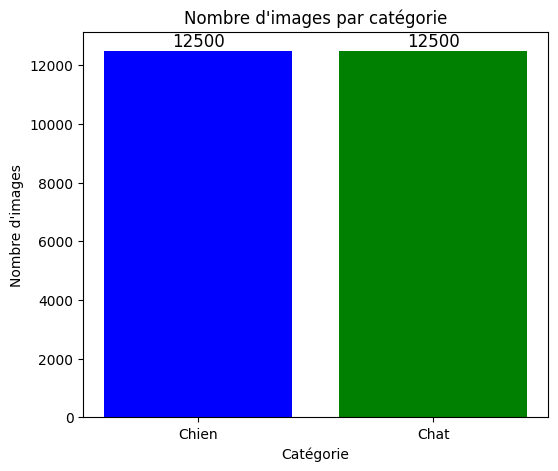

In [12]:
# Créer un graphique en nombre des catégories
compte_categories = df['category'].value_counts()
noms_categories = ['Chien', 'Chat']


plt.figure(figsize=(6, 5))
couleurs = ['blue', 'green']  # Couleurs compréhensibles
plt.bar(noms_categories, compte_categories, color=couleurs)
plt.xlabel('Catégorie')
plt.ylabel('Nombre d\'images')
plt.title('Nombre d\'images par catégorie')

for i, v in enumerate(compte_categories):
    plt.text(i, v, str(v), ha='center', va='bottom', fontsize=12, color='black')

/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/6030.jpg


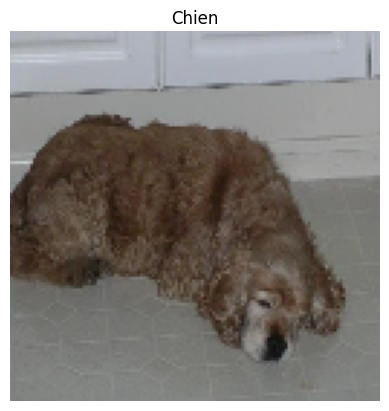

In [13]:
# Sélectionner une image aléatoire
image_aleatoire = random.choice(noms_fichiers)
print(image_aleatoire)

# Charger et afficher l'image
img = image.load_img(image_aleatoire, target_size=(128, 128))
plt.imshow(img)
categorie = 'Chien' if image_aleatoire.split('/')[-2] == 'Dog' else 'Chat'
plt.title(categorie)
plt.axis('off')
plt.show()

## Prétraitement des données pour la génération d'images

1. Lire les fichiers d'image

La première étape consiste à lire les fichiers d'image à partir de votre stockage. Cela permet de charger les images brutes dans votre programme pour les étapes suivantes de prétraitement.

2. Décoder le contenu JPEG en grilles de pixels RGB

Une fois que les images sont lues, nous devons les décoder à partir de leur format JPEG compressé en grilles de pixels RGB (Rouge, Vert, Bleu). Cela transforme l'image en une matrice de valeurs numériques représentant les couleurs.

3. Convertir ces grilles en tableaux de nombres à virgule flottante

Les réseaux de neurones travaillent mieux avec des nombres. Nous devons donc convertir les grilles de pixels en tableaux de nombres à virgule flottante pour pouvoir les utiliser dans nos modèles de deep learning.

4. Rescaler les valeurs des pixels entre 0 et 255 à l'intervalle 0,1

Les réseaux de neurones préfèrent traiter des valeurs d'entrée petites et normalisées. Nous devons donc rescaler les valeurs des pixels de leur intervalle original [0, 255] à l'intervalle [0, 1].

Cette étape de normalisation permet d'améliorer la performance et la stabilité du modèle d'apprentissage, en garantissant que les valeurs d'entrée sont petites et homogènes.

In [14]:
# Sélectionner aléatoirement 1500 images de chats (catégorie 0)
df_final = selectionner_images_aleatoire(df, n=1500)
df_final

,filename,category
0,Cat/12484.jpg,0
1,Cat/2572.jpg,0
2,Cat/3839.jpg,0
3,Cat/5257.jpg,0
4,Cat/5865.jpg,0
...,...,...
2995,Dog/420.jpg,1
2996,Dog/12258.jpg,1
2997,Dog/9899.jpg,1
2998,Dog/10112.jpg,1


In [15]:
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Ré-échelle les valeurs des pixels entre 0 et 255 à l'intervalle 0,1
    validation_split=0.2  # 20% des données pour la validation
)

In [16]:
# S'assurer que la colonne 'category' contient des chaînes de caractères
df_final['category'] = df_final['category'].astype(str)

# Générateur pour les données d'entraînement
train_generator = train_datagen.flow_from_dataframe(
    df_final,
    pet_images_dir,
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    subset='training'  # Utiliser les données d'entrainnement
)


# Générateur pour les données de validation
validation_generator = train_datagen.flow_from_dataframe(
    df_final,
    pet_images_dir,
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary',
    subset='validation'  # Utiliser les données de validation
)

Found 2400 validated image filenames belonging to 2 classes.
Found 600 validated image filenames belonging to 2 classes.


Taille du lot de données : (32, 150, 150, 3)
Taille du lot d'étiquettes : (32,)


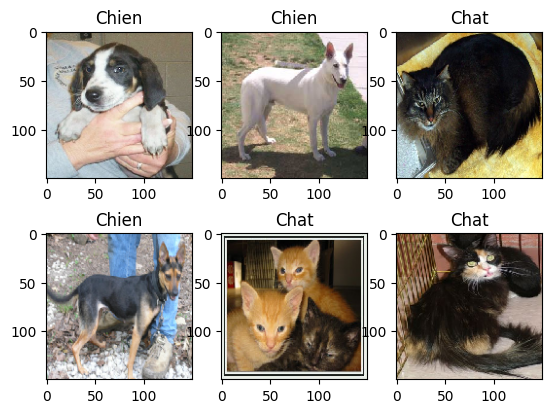

In [17]:
# Affichage de quelques images pour vérifier le prétraitement
for data_batch, labels_batch in train_generator:
    print("Taille du lot de données :", data_batch.shape)  # Affiche la forme du lot de données
    print("Taille du lot d'étiquettes :", labels_batch.shape)  # Affiche la forme du lot d'étiquettes
    for i in range(6):
        plt.subplot(2, 3, i + 1)
        plt.imshow(data_batch[i])  # Affiche l'image prétraitée
        plt.title("Chat" if labels_batch[i] == 0 else "Chien")  # Titre en fonction de l'étiquette
    plt.show()
    break  # Affiche un seul lot d'images

## Convolutional Neural Network (CNN)

Création du réseau de neuronnes

In [18]:
model = models.Sequential()

# Ajouter les couches une par une

model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))  # Couche de convolution : 32 filtres de 3x3, détecte des motifs simples dans l'image, ReLU pour rendre le modèle non-linéaire, forme d'entrée (150x150x3).

model.add(layers.MaxPooling2D((2, 2)))  # Couche de max pooling : réduit les dimensions de l'image en prenant le maximum de chaque carré de 2x2 pixels.

model.add(layers.Conv2D(64, (3, 3), activation='relu'))  # Deuxième couche de convolution : 64 filtres de 3x3, détecte des motifs plus complexes, ReLU pour l'activation.

model.add(layers.MaxPooling2D((2, 2)))  # Deuxième couche de max pooling : réduit encore les dimensions de l'image.

model.add(layers.Conv2D(128, (3, 3), activation='relu'))  # Troisième couche de convolution : 128 filtres de 3x3, détecte des motifs encore plus complexes, ReLU pour l'activation.

model.add(layers.MaxPooling2D((2, 2)))  # Troisième couche de max pooling : réduit encore les dimensions de l'image.

model.add(layers.Flatten())  # Couche Flatten : transforme les données 2D en un vecteur 1D pour la couche dense suivante.

model.add(layers.Dense(512, activation='relu'))  # Couche dense (fully connected) : 512 neurones, chaque neurone est connecté à tous les neurones de la couche précédente, ReLU pour l'activation.

model.add(layers.Dense(1, activation='sigmoid'))  # Couche de sortie : 1 neurone, activation sigmoïde pour produire une probabilité entre 0 et 1, utilisée pour la classification binaire (chat ou chien).


# Summary
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1752045386.575505      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1752045386.576214      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,940,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,034,177 (72.61 MB)

 Trainable params: 19,034,177 (72.61 MB)

 Non-trainable params: 0 (0.00 B)

In [19]:
# Complier le model
optimi = optimizers.RMSprop(learning_rate=1e-4)
model.compile(optimizer=optimi,
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [20]:
# Entraînement du modèle et sauvegarde de l'historique d'entraînement dans 'history'
history = model.fit(
    train_generator,  # Utilise le générateur pour les données d'entraînement

    # Le nombre d'étapes (batches) à exécuter à chaque époque.
    # Calculé comme le nombre total d'échantillons d'entraînement divisé par la taille du lot.
    steps_per_epoch=train_generator.samples // train_generator.batch_size,

    epochs=30,  # Nombre total d'époques pour l'entraînement

    validation_data=validation_generator,  # Utilise le générateur pour les données de validation

    # Le nombre d'étapes (batches) à exécuter pour chaque époque de validation.
    # Calculé comme le nombre total d'échantillons de validation divisé par la taille du lot.
    validation_steps=validation_generator.samples // validation_generator.batch_size
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


I0000 00:00:1752045390.147966      86 service.cc:148] XLA service 0x7e4268004120 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1752045390.148766      86 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1752045390.148784      86 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1752045390.413622      86 cuda_dnn.cc:529] Loaded cuDNN version 90300


 1/75 ━━━━━━━━━━━━━━━━━━━━ 6:33 5s/step - accuracy: 0.5000 - loss: 0.6965

I0000 00:00:1752045393.513394      86 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


19/75 ━━━━━━━━━━━━━━━━━━━━ 13s 249ms/step - accuracy: 0.5688 - loss: 0.6768

/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


75/75 ━━━━━━━━━━━━━━━━━━━━ 30s 338ms/step - accuracy: 0.6025 - loss: 0.6616 - val_accuracy: 0.0000e+00 - val_loss: 0.8967
Epoch 2/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 83ms/step - accuracy: 0.6280 - loss: 0.6326 - val_accuracy: 0.0503 - val_loss: 1.1274
Epoch 3/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 82ms/step - accuracy: 0.6726 - loss: 0.5873 - val_accuracy: 0.0903 - val_loss: 1.1116
Epoch 4/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 81ms/step - accuracy: 0.6969 - loss: 0.5640 - val_accuracy: 0.1545 - val_loss: 1.0710
Epoch 5/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 80ms/step - accuracy: 0.7226 - loss: 0.5409 - val_accuracy: 0.2622 - val_loss: 1.0245
Epoch 6/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - accuracy: 0.7371 - loss: 0.5298 - val_accuracy: 0.3663 - val_loss: 0.9361
Epoch 7/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - accuracy: 0.7656 - loss: 0.4901 - val_accuracy: 0.5000 - val_loss: 0.7804
Epoch 8/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - accuracy: 0.7657 - loss: 0.4875 - val_accuracy: 0.5104 - val_lo

In [21]:
# Évaluer les performances du modèle sur la base de validation
validation_steps = validation_generator.samples // validation_generator.batch_size
evaluation = model.evaluate(validation_generator, steps=validation_steps)

# Afficher les résultats de l'évaluation
print(f"Perte sur la validation: {evaluation[0]}")
print(f"Précision sur la validation: {evaluation[1]}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - accuracy: 0.6388 - loss: 0.9515
Perte sur la validation: 0.8935636878013611
Précision sur la validation: 0.6701388955116272


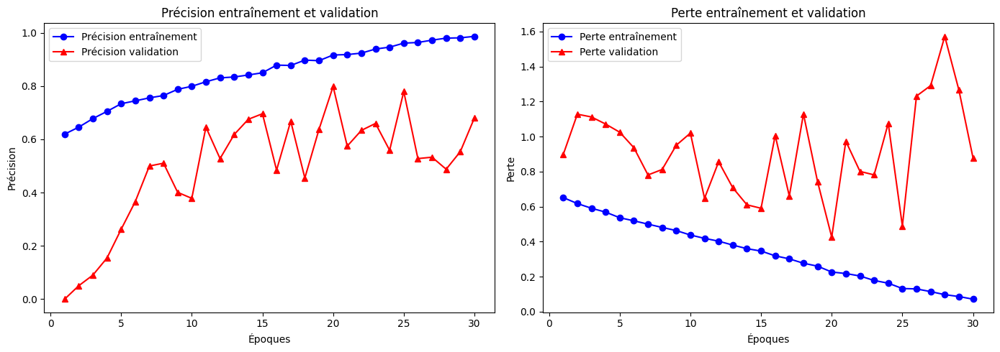

In [29]:
# Afficher les courbes d'apprentissage
plot_curves(history)

##### Analyse des courbes d’apprentissage : 
* Précision :
La précision sur les données d'entraînement augmente régulièrement au fil des époques, ce qui indique que le modèle apprend correctement sur l’ensemble d'entraînement.
En revanche, la précision sur les données de validation fluctue fortement et ne s'améliore pas clairement, ce qui suggère que le modèle ne généralise pas bien aux données qu’il n’a jamais vues.
* Fonction de perte (loss) :
La perte sur l'entraînement diminue progressivement, ce qui est cohérent avec une phase d’apprentissage normale.
    Cependant, la perte sur la validation reste élevée ou stagne, voire augmente, ce qui est un signe classique de surapprentissage (overfitting).
* Conclusion :
Il y a un overfitting évident : le modèle apprend trop bien les données d’entraînement mais échoue à généraliser.
* Cela peut être dû à :
    - un jeu de données trop petit,
    - un modèle trop complexe par rapport à la quantité de données,
    - un manque de régularisation (ex : pas d'augmentation de données, pas de dropout...).

#### TEST 

In [30]:
# Générateur pour les données de test
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    df_final,
    pet_images_dir,
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=10,
    class_mode='binary',
    shuffle=False  # Ne pas mélanger les données de test
)

Found 3000 validated image filenames belonging to 2 classes.


In [31]:
# Faire des prédictions
predictions = model.predict(test_generator)

# Convertir les prédictions en classes (0 ou 1)
predicted_classes = (predictions > 0.5).astype(int).flatten()

# Ajouter les prédictions au DataFrame
df_final['predictions'] = predicted_classes
df_final

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


176/300 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step

/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


300/300 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step


,filename,category,predictions
0,Cat/12484.jpg,0,0
1,Cat/2572.jpg,0,1
2,Cat/3839.jpg,0,0
3,Cat/5257.jpg,0,0
4,Cat/5865.jpg,0,0
...,...,...,...
2995,Dog/420.jpg,1,1
2996,Dog/12258.jpg,1,1
2997,Dog/9899.jpg,1,1
2998,Dog/10112.jpg,1,1


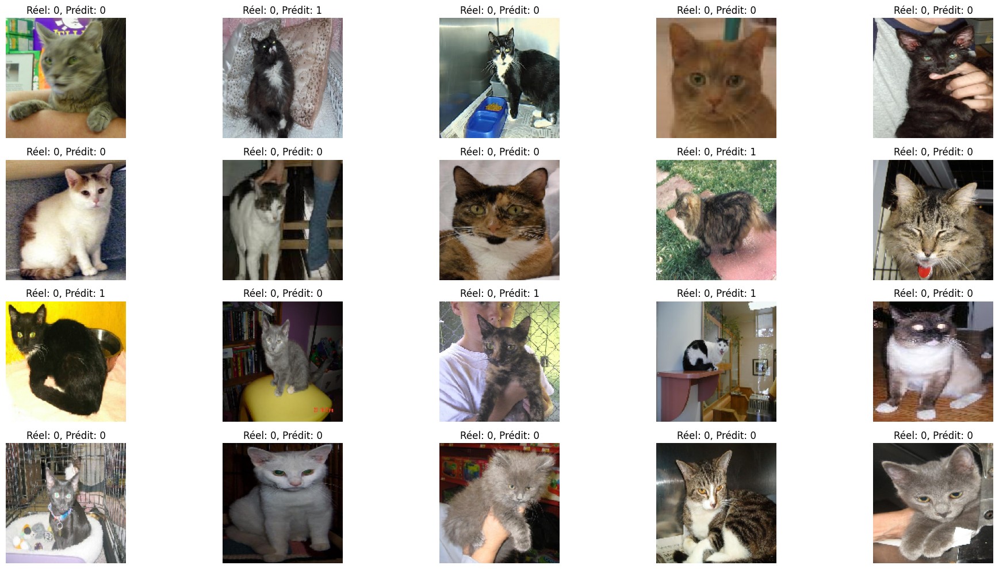

In [32]:
# Afficher les résultats pour les 20 images (10 chats et 10 chiens)
plt.figure(figsize=(20, 10))
for i, row in df_final.head(20).iterrows():
    img_path = os.path.join(pet_images_dir, row['filename'])
    img = load_img(img_path, target_size=(150, 150))
    plt.subplot(4, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Réel: {row['category']}, Prédit: {row['predictions']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Data Augmentation
###  Principe de la Data Augmentation

La data augmentation est une technique utilisée en apprentissage automatique et en vision par ordinateur pour augmenter la taille du jeu de données d'entraînement. Elle permet d'améliorer la performance des modèles en générant de nouvelles données à partir des données existantes. Voici les principaux points à retenir :

- **Définition** :
  - La data augmentation consiste à appliquer des transformations diverses aux images d'entraînement pour créer de nouvelles images.
  
- **Objectifs** :
  - **Augmenter la diversité des données** : Générer des variations des images existantes pour mieux représenter les différents scénarios possibles.
  - **Réduire le surapprentissage** : Enrichir le jeu de données pour éviter que le modèle ne mémorise les données d'entraînement plutôt que d'apprendre à généraliser.
  - **Améliorer la robustesse du modèle** : Entraîner le modèle à reconnaître les objets dans des conditions variées (éclairage, rotation, échelle, etc.).

- **Techniques courantes de data augmentation** :
  - **Rotation** : Tourner les images d'un certain angle.
  - **Translation** : Déplacer les images horizontalement ou verticalement.
  - **Miroir/Flip** : Inverser les images horizontalement ou verticalement.
  - **Zoom** : Agrandir ou rétrécir les images.
  - **Recadrage/Cropping** : Découper une partie de l'image et l'utiliser comme nouvelle image.
  - **Changement de luminosité/contraste** : Modifier les niveaux de luminosité et de contraste des images.
  - **Ajout de bruit** : Introduire du bruit aléatoire pour simuler des imperfections dans les images.

- **Avantages** :
  - **Meilleure généralisation** : Permet au modèle de mieux généraliser sur des données nouvelles et non vues.
  - **Coût efficace** : Générer des données augmentées est souvent moins coûteux que de collecter de nouvelles données réelles.
  
- **Limitations** :
  - **Complexité computationnelle** : La génération de données augmentées peut augmenter le temps d'entraînement.
  - **Qualité des transformations** : Les transformations doivent être réalistes et pertinentes pour ne pas introduire de biais dans l'entraînement.




### Exemples data augmentation

In [38]:
# Fonction pour afficher l'image originale et transformée
def plot_before_and_after(original, transformed, title):
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(original)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(title)
    plt.imshow(transformed)
    plt.axis('off')

    plt.show()

In [39]:
# Chemin vers le répertoire contenant l'images d'exemple
ex_img = 'Cat/5865.jpg'
image_path = os.path.join(pet_images_dir, ex_img)

# Charger et prétraiter l'image
img = load_img(image_path, target_size=(150, 150))
img_array = img_to_array(img) / 255.0

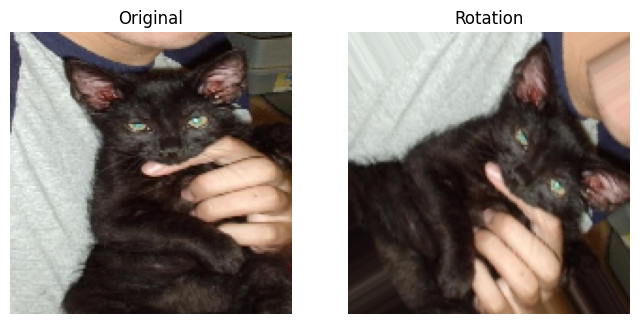

In [40]:
# Transformation de rotation
rotation_datagen = ImageDataGenerator(rotation_range=60)
rotated_img = rotation_datagen.random_transform(img_array)
plot_before_and_after(img_array, rotated_img, "Rotation")

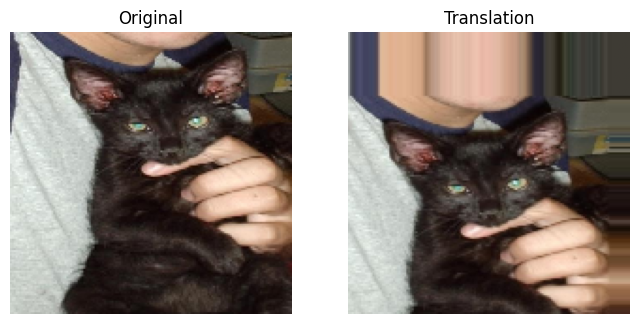

In [41]:
# Transformation de translation
translation_datagen = ImageDataGenerator(width_shift_range=0.5, height_shift_range=0.2)
translated_img = translation_datagen.random_transform(img_array)
plot_before_and_after(img_array, translated_img, "Translation")

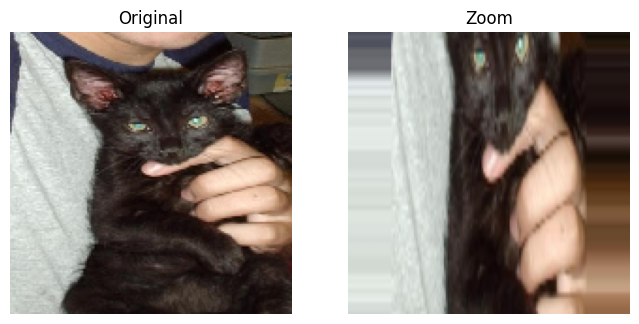

In [45]:
# Transformation de zoom
zoom_datagen = ImageDataGenerator(zoom_range=0.7)
zoomed_img = zoom_datagen.random_transform(img_array)
plot_before_and_after(img_array, zoomed_img, "Zoom")

#### Applicationnde de la Data Augmentation dans le projet

In [46]:
# Sélectionner aléatoirement 1500 images de chats (catégorie 0)
chats_df = df[df['category'] == 0].sample(n=1500, random_state=42)

# Sélectionner aléatoirement 1500 images de chiens (catégorie 1)
chiens_df = df[df['category'] == 1].sample(n=1500, random_state=42)

# Combiner les deux DataFrames
df_final = pd.concat([chats_df, chiens_df]).reset_index(drop=True)
df_final


# S'assurer que la colonne 'category' contient des chaînes de caractères
df_final['category'] = df_final['category'].astype(str)

df_final

,filename,category
0,Cat/12484.jpg,0
1,Cat/2572.jpg,0
2,Cat/3839.jpg,0
3,Cat/5257.jpg,0
4,Cat/5865.jpg,0
...,...,...
2995,Dog/420.jpg,1
2996,Dog/12258.jpg,1
2997,Dog/9899.jpg,1
2998,Dog/10112.jpg,1


In [47]:
# Diviser les données en ensembles d'entraînement et de test
df_train, df_test = train_test_split(df_final, test_size=0.2, random_state=42)

# Afficher la taille des ensembles d'entraînement et de test
print(f"Taille de l'ensemble d'entraînement : {df_train.shape[0]}")
print(f"Taille de l'ensemble de test : {df_test.shape[0]}")

Taille de l'ensemble d'entraînement : 2400
Taille de l'ensemble de test : 600


In [48]:
# Création de l'objet ImageDataGenerator avec data augmentation

# Train
train_datagen = ImageDataGenerator(
    rescale=1./255,             # Normalise les pixels entre 0 et 1
    rotation_range=40,          # Rotation aléatoire des images jusqu'à 40 degrés
    width_shift_range=0.2,      # Translation horizontale aléatoire jusqu'à 20% de la largeur de l'image
    height_shift_range=0.2,     # Translation verticale aléatoire jusqu'à 20% de la hauteur de l'image
    shear_range=0.2,            # Application de cisaillement
    zoom_range=0.2,             # Zoom aléatoire sur les images
    horizontal_flip=True,       # Flip horizontal des images
    fill_mode='nearest'         # Remplissage des pixels manquants après la transformation
)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    directory=pet_images_dir,
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

# Validation

test_datagen = ImageDataGenerator(rescale=1./255)  # Normalise les pixels entre 0 et 1

validation_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test,
    directory=pet_images_dir,
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=32,
    class_mode='binary'
)

Found 2400 validated image filenames belonging to 2 classes.
Found 600 validated image filenames belonging to 2 classes.


In [49]:
# Définir le modèle convolutif avec dropout
model = models.Sequential()

# Couche de convolution avec 32 filtres de taille 3x3, activation ReLU et entrée de taille 150x150x3
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)))

# Couche de max pooling de taille 2x2
model.add(layers.MaxPooling2D((2, 2)))

# Couche de convolution avec 64 filtres de taille 3x3 et activation ReLU
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

# Couche de max pooling de taille 2x2
model.add(layers.MaxPooling2D((2, 2)))

# Couche de convolution avec 128 filtres de taille 3x3 et activation ReLU
model.add(layers.Conv2D(128, (3, 3), activation='relu'))

# Couche de max pooling de taille 2x2
model.add(layers.MaxPooling2D((2, 2)))

# Couche de convolution avec 64 filtres de taille 3x3 et activation ReLU
model.add(layers.Conv2D(64, (3, 3), activation='relu'))

# Couche de max pooling de taille 2x2
model.add(layers.MaxPooling2D((2, 2)))

# Couche de dropout avec un taux de 0.5 pour éviter le surapprentissage
model.add(layers.Dropout(0.5))

# Couche de flatten pour convertir les données 2D en 1D
model.add(layers.Flatten())

# Couche dense avec 512 neurones et activation ReLU
model.add(layers.Dense(512, activation='relu'))

# Couche dense avec 1 neurone et activation sigmoïde pour la classification binaire
model.add(layers.Dense(1, activation='sigmoid'))



# Afficher le résumé du modèle
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 15, 15, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │     1,606,144 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,773,697 (6.77 MB)

 Trainable params: 1,773,697 (6.77 MB)

 Non-trainable params: 0 (0.00 B)

In [50]:
# Compiler le model
model.compile(loss='binary_crossentropy',
              optimizer=optimizers.RMSprop(learning_rate=1e-4),
              metrics=['acc'])

In [51]:
# Entraînement du modèle et sauvegarde de l'historique d'entraînement dans 'history'
history = model.fit(
    train_generator,  # Utilise le générateur pour les données d'entraînement

    # Le nombre d'étapes (batches) à exécuter à chaque époque.
    # Calculé comme le nombre total d'échantillons d'entraînement divisé par la taille du lot.
    steps_per_epoch=train_generator.samples // train_generator.batch_size,

    epochs=30,  # Nombre total d'époques pour l'entraînement

    validation_data=validation_generator,  # Utilise le générateur pour les données de validation

    # Le nombre d'étapes (batches) à exécuter pour chaque époque de validation.
    # Calculé comme le nombre total d'échantillons de validation divisé par la taille du lot.
    validation_steps=validation_generator.samples // validation_generator.batch_size
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
32/75 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - acc: 0.4705 - loss: 0.6976

/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


75/75 ━━━━━━━━━━━━━━━━━━━━ 21s 233ms/step - acc: 0.4847 - loss: 0.6961 - val_acc: 0.4896 - val_loss: 0.6918
Epoch 2/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 17s 222ms/step - acc: 0.5284 - loss: 0.6909 - val_acc: 0.5990 - val_loss: 0.6853
Epoch 3/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 16s 218ms/step - acc: 0.5283 - loss: 0.6876 - val_acc: 0.5451 - val_loss: 0.6783
Epoch 4/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 17s 222ms/step - acc: 0.5549 - loss: 0.6772 - val_acc: 0.6059 - val_loss: 0.6651
Epoch 5/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - acc: 0.5880 - loss: 0.6682 - val_acc: 0.6094 - val_loss: 0.6559
Epoch 6/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - acc: 0.5900 - loss: 0.6679 - val_acc: 0.5799 - val_loss: 0.6675
Epoch 7/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 18s 240ms/step - acc: 0.5958 - loss: 0.6605 - val_acc: 0.5868 - val_loss: 0.6652
Epoch 8/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 20s 258ms/step - acc: 0.5859 - loss: 0.6623 - val_acc: 0.6545 - val_loss: 0.6365
Epoch 9/30
75/75 ━━━━━━━━━━━━━━━━━━━━ 17s 222ms/step - acc:

In [52]:
# Évaluer les performances du modèle sur la base de validation
validation_steps = validation_generator.samples // validation_generator.batch_size
evaluation = model.evaluate(validation_generator, steps=validation_steps)

# Afficher les résultats de l'évaluation
print(f"Perte sur la validation: {evaluation[0]}")
print(f"Précision sur la validation: {evaluation[1]}")

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - acc: 0.7196 - loss: 0.5663
Perte sur la validation: 0.5480157732963562
Précision sur la validation: 0.7291666865348816


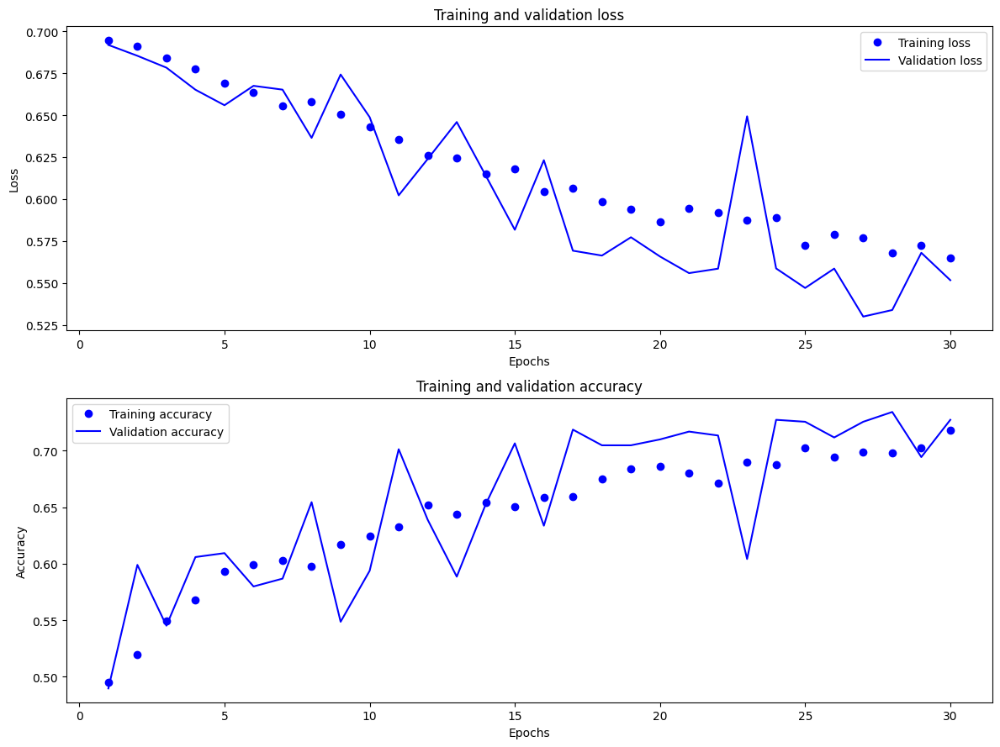

In [56]:
# Afficher les courbes d'apprentissage
# plot_curves(history)

history_dict = history.history

# Récupérer les valeurs de perte et d'exactitude pour chaque époque
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['acc']
val_acc_values = history_dict['val_acc']

epochs = range(1, len(loss_values) + 1)

# Tracer la courbe de la perte d'entraînement et de validation
plt.figure(figsize=(12, 9))

plt.subplot(2, 1, 1)
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Tracer la courbe de l'exactitude d'entraînement et de validation
plt.subplot(2, 1, 2)
plt.plot(epochs, acc_values, 'bo', label='Training accuracy')
plt.plot(epochs, val_acc_values, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

##### Analyse des courbes d’apprentissage après data augmentation
* Amélioration des performances :
Grâce à l’ajout de techniques de data augmentation, l'accuracy sur les données de validation est passée de 63 % à 71 %, ce qui représente une amélioration significative. Cela montre que le modèle a mieux appris à généraliser à partir de données transformées, en s'adaptant à davantage de variations visuelles.
* Réduction partielle de l’overfitting :
Bien que la data augmentation ait permis de réduire l'écart entre les courbes d'entraînement et de validation, un léger overfitting subsiste :
    - L'accuracy continue de croître sur l'entraînement, mais plafonne ou fluctue légèrement sur la validation.
    - La loss de validation reste supérieure à celle de l'entraînement et ne diminue pas autant, ce qui est un signe que le modèle continue d'apprendre les spécificités du jeu d'entraînement.
* Hypothèses possibles :
Ce surapprentissage peut s’expliquer par :
un jeu de données encore insuffisamment varié malgré l’augmentation,
une capacité du modèle trop élevée (architecture trop complexe),
ou un entraînement trop long sans régularisation supplémentaire.

* Toutefois, les performances restent limitées car le modèle est entraîné depuis zéro, sans bénéficier de connaissances préalables.

##### Tester le nv model

In [57]:
# Sélectionner aléatoirement 10 images 
df_final_pred = selectionner_images_aleatoire(df, n=10)
df_final_pred

,filename,category
0,Cat/12484.jpg,0
1,Cat/2572.jpg,0
2,Cat/3839.jpg,0
3,Cat/5257.jpg,0
4,Cat/5865.jpg,0
5,Cat/9558.jpg,0
6,Cat/1434.jpg,0
7,Cat/10858.jpg,0
8,Cat/10587.jpg,0
9,Cat/9344.jpg,0


In [58]:
# Générateur pour les données de test
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    df_final_pred,
    directory=pet_images_dir,
    x_col='filename',
    y_col='category',
    target_size=(150, 150),
    batch_size=10,
    class_mode='binary',
    shuffle=False  # Ne pas mélanger les données de test
)

# Faire des prédictions
predictions = model.predict(test_generator)

Found 20 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step 


In [59]:
# Convertir les prédictions en classes (0 ou 1)
predicted_classes = (predictions > 0.5).astype(int).flatten()

# Ajouter les prédictions au DataFrame
df_final_pred['predictions'] = predicted_classes
df_final_pred

,filename,category,predictions
0,Cat/12484.jpg,0,1
1,Cat/2572.jpg,0,1
2,Cat/3839.jpg,0,0
3,Cat/5257.jpg,0,0
4,Cat/5865.jpg,0,1
5,Cat/9558.jpg,0,0
6,Cat/1434.jpg,0,0
7,Cat/10858.jpg,0,0
8,Cat/10587.jpg,0,1
9,Cat/9344.jpg,0,1


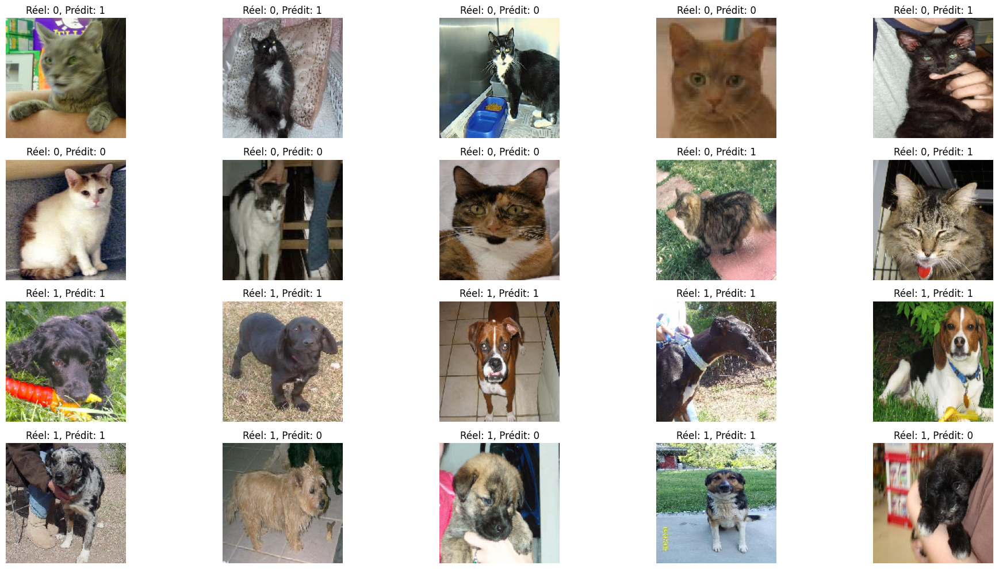

In [60]:
# Afficher les résultats pour les 20 images (10 chats et 10 chiens)
plt.figure(figsize=(20, 10))
for i, row in df_final_pred.head(20).iterrows():
    img_path = os.path.join(pet_images_dir, row['filename'])
    img = load_img(img_path, target_size=(150, 150))
    plt.subplot(4, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Réel: {row['category']}, Prédit: {row['predictions']}")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Utilisation d'un modèle pré-entrainé (Transfert Learning)

Les modèles préentraînés offrent une solution puissante pour la classification des images, permettant de tirer parti de réseaux de neurones préalablement entraînés sur de larges ensembles de données. Deux méthodes principales sont couramment utilisées : l'extraction de caractéristiques (feature extraction) et le fine-tuning.

## Méthodes

### 1. Extraction de Caractéristiques (Feature Extraction)

L'extraction de caractéristiques consiste à utiliser un modèle préentraîné comme un extracteur de caractéristiques. Les couches convolutives du modèle sont utilisées pour extraire des caractéristiques des images, qui sont ensuite utilisées par un classificateur (tel qu'un réseau de neurones entièrement connecté) pour effectuer la classification.

**Étapes :**
1. Charger un modèle préentraîné sans la couche de classification finale.
2. Geler les poids des couches convolutives pour éviter de les entraîner à nouveau.
3. Ajouter une ou plusieurs couches de classification.
4. Entraîner uniquement les nouvelles couches de classification avec les nouvelles données.

### 2. Fine-Tuning

Le fine-tuning consiste à ajuster les poids de tout ou partie d'un modèle préentraîné en utilisant un nouvel ensemble de données. Cela permet d'adapter le modèle préentraîné à la nouvelle tâche de classification.

**Étapes :**
1. Charger un modèle préentraîné.
2. Débloquer certaines des dernières couches du modèle pour permettre leur réentraînement.
3. Ajouter des couches de classification si nécessaire.
4. Entraîner le modèle entier (ou les couches dégelées) avec les nouvelles données.

## Modèles Préentraînés Possibles

Voici une liste de quelques modèles préentraînés populaires que l'on peut utiliser pour la classification des images :

- **[VGG16](https://keras.io/api/applications/vgg/#vgg16-function)** : Un modèle de convolution profond avec 16 couches.
- **[VGG19](https://keras.io/api/applications/vgg/#vgg19-function)** : Une version étendue de VGG16 avec 19 couches.
- **[ResNet50](https://keras.io/api/applications/resnet/#resnet50-function)** : Un réseau résiduel avec 50 couches, connu pour ses performances élevées sur divers ensembles de données.
- **[InceptionV3](https://keras.io/api/applications/inceptionv3/)** : Un modèle de Google qui utilise des modules inception pour capturer des informations à différentes échelles.
- **[Xception](https://keras.io/api/applications/xception/)** : Une version extrême de l'Inception, qui sépare les convolutions en profondeur.
- **[MobileNet](https://keras.io/api/applications/mobilenet/)** : Un modèle efficace en termes de calcul, idéal pour les applications mobiles et embarquées.
- **[DenseNet](https://keras.io/api/applications/densenet/)** : Un réseau dense qui connecte chaque couche à toutes les couches précédentes pour améliorer la propagation des gradients.
- **[EfficientNet](https://keras.io/api/applications/efficientnet/)** : Une famille de modèles qui équilibrent la taille du réseau, la profondeur, la largeur et la résolution des images pour obtenir de meilleures performances avec moins de paramètres.

En utilisant ces modèles préentraînés, il est possible de créer des systèmes de classification d'images robustes et précis en peu de temps, tout en bénéficiant des connaissances accumulées à partir de vastes ensembles de données d'entraînement.


In [61]:
from tensorflow.keras.applications import VGG16

# Initialisation de la base convolutionnelle du modèle VGG16 préentraîné.
# weights='imagenet' signifie que le modèle est préentraîné sur l'ensemble de données ImageNet, qui contient des millions d'images annotées.
# include_top=False signifie que les couches de classification dense (top layers) ne sont pas incluses,
# ce qui permet d'utiliser le modèle comme un extracteur de caractéristiques sans la dernière couche de classification.
# input_shape=(150, 150, 3) définit la taille des images d'entrée attendues par le modèle (150x150 pixels avec 3 canaux pour RGB).
conv_base = VGG16(weights='imagenet',
                  include_top=False,
                  input_shape=(150, 150, 3))

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [62]:
conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

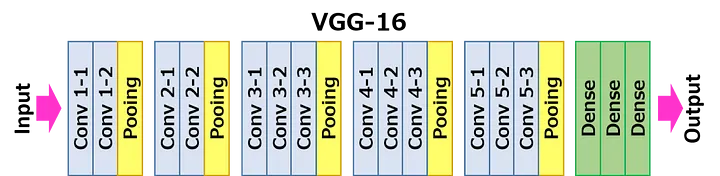

# Techniques pour Entraîner un Modèle Préentraîné

Lors de l'utilisation de modèles préentraînés pour la classification d'images, deux techniques principales peuvent être appliquées : l'extraction rapide des caractéristiques sans augmentation des données et l'extraction des caractéristiques avec augmentation des données.

## 1. Extraction Rapide des Caractéristiques SANS Augmentation des Données

Cette technique utilise les couches convolutives d'un modèle préentraîné pour extraire des caractéristiques des images sans augmentation des données.

### Étapes :
- Charger le modèle préentraîné sans la couche de classification finale.
- Geler les poids des couches convolutives.
- Ajouter des couches de classification.
- Compiler et entraîner le modèle avec les nouvelles données.

## 2. Extraction des Caractéristiques AVEC Augmentation des Données

Cette technique utilise les couches convolutives d'un modèle préentraîné pour extraire des caractéristiques des images tout en utilisant l'augmentation des données.

### Étapes :
- Charger le modèle préentraîné sans la couche de classification finale.
- Geler les poids des couches convolutives.
- Configurer l'augmentation des données (rotation, retournement, zoom, etc.).
- Ajouter des couches de classification.
- Compiler et entraîner le modèle avec les données augmentées.


## - Technique sans data augmentation

In [63]:
# Initialiser les générateurs de données pour extraire les caractéristiques
data_gen = ImageDataGenerator(rescale=1./255)
batch_size = 20
filepath = pet_images_dir

# Diviser les données en ensembles d'entraînement et de test
df_train, df_test = train_test_split(df_final, test_size=0.2, random_state=42)

# Afficher la taille des ensembles d'entraînement et de test
print(f"Taille de l'ensemble d'entraînement : {df_train.shape[0]}")
print(f"Taille de l'ensemble de test : {df_test.shape[0]}")

Taille de l'ensemble d'entraînement : 2400
Taille de l'ensemble de test : 600


In [64]:
# Extraire les feactures via le pre-trained model VGG16  - Train
train_features, train_labels = extract_features(df_train, 2400)

Found 2400 validated image filenames belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8

/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━

In [65]:
# Validation
val_features, val_labels = extract_features(df_test, 600)
test_features, test_labels = val_features, val_labels

Found 600 validated image filenames belonging to 2 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

In [66]:
# Aplatir les caractéristiques
train_features = train_features.reshape((2400, 4 * 4 * 512)) # Car sur la derniere couche du model utilisisé on une dimension 4 * 4 * 512 (block5_pool (MaxPooling2D) │ (None, 4, 4, 512))
# Aplatir les caractéristiques

val_features = val_features.reshape((600, 4 * 4 * 512))


# Construire et compiler le modèle de classification
model = models.Sequential()
model.add(layers.Dense(256, activation='relu', input_dim=4 * 4 * 512))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1, activation='sigmoid'))

# Summary()
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_4 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,097,665 (8.00 MB)

 Trainable params: 2,097,665 (8.00 MB)

 Non-trainable params: 0 (0.00 B)

In [67]:
# Compile & Train

model.compile(optimizer=optimizers.RMSprop(learning_rate=2e-5),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Entraîner le modèle
history = model.fit(train_features, train_labels,
                    epochs=30,
                    batch_size=20,
                    validation_data=(val_features, val_labels))

Epoch 1/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.6229 - loss: 0.6567 - val_accuracy: 0.8350 - val_loss: 0.4181
Epoch 2/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8037 - loss: 0.4266 - val_accuracy: 0.8617 - val_loss: 0.3573
Epoch 3/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8571 - loss: 0.3378 - val_accuracy: 0.8800 - val_loss: 0.3193
Epoch 4/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8588 - loss: 0.3210 - val_accuracy: 0.8900 - val_loss: 0.3011
Epoch 5/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8818 - loss: 0.2945 - val_accuracy: 0.8933 - val_loss: 0.2864
Epoch 6/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9024 - loss: 0.2500 - val_accuracy: 0.8950 - val_loss: 0.2826
Epoch 7/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8982 - loss: 0.2555 - val_accuracy: 0.8850 - val_loss: 0.2788
Epoch 8/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8914 - loss: 0.2601 - val_accuracy: 0.

In [68]:
# Test sur la base de validation
val_features = val_features.reshape((600, 4 * 4 * 512))


# Évaluation du modèle sur l'ensemble de test
test_loss, test_acc = model.evaluate(val_features, val_labels)
print(f'Test accuracy: {test_acc:.2f}')

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.9040 - loss: 0.2604
Test accuracy: 0.90


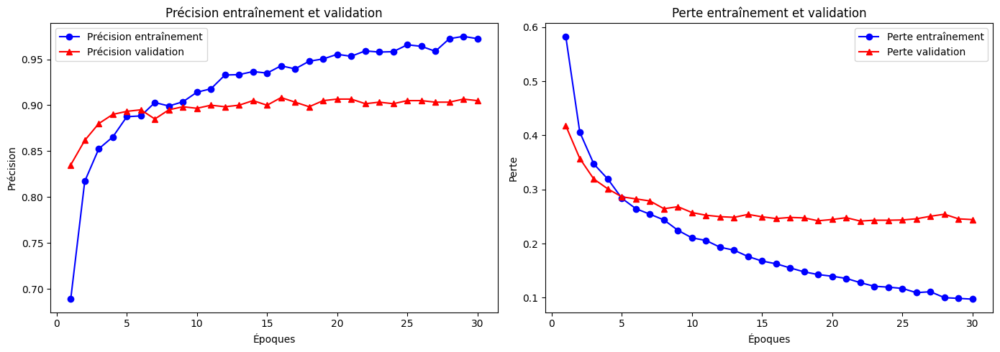

In [71]:
# Tracer les courbes d'apprentissage pour l'entraînement et la validation
plot_curves(history)

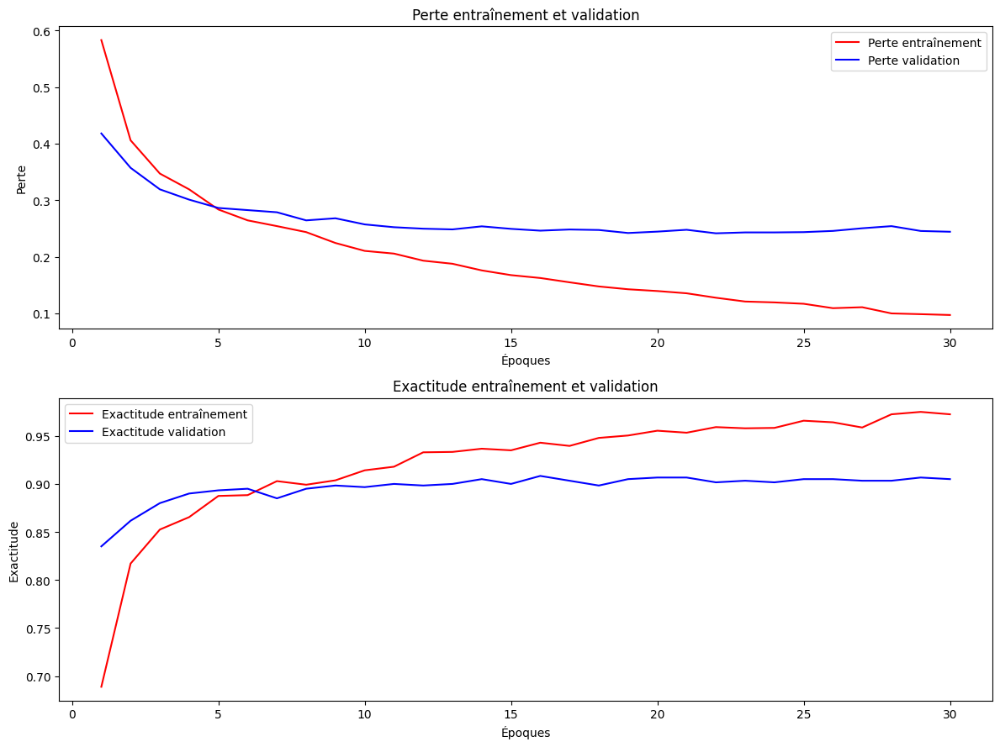

In [69]:
# Tracer les courbes d'apprentissage pour l'entraînement et la validation
history_dict = history.history

# Récupérer les valeurs de perte et d'exactitude pour chaque époque
loss_values = history_dict['loss']
val_loss_values = history_dict['val_loss']
acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']

epochs = range(1, len(loss_values) + 1)

import matplotlib.pyplot as plt

# Tracer la courbe de la perte d'entraînement et de validation
plt.figure(figsize=(12, 9))

plt.subplot(2, 1, 1)
plt.plot(epochs, loss_values, 'r-', label='Perte entraînement')  # Rouge pour la perte d'entraînement
plt.plot(epochs, val_loss_values, 'b-', label='Perte validation')  # Bleu pour la perte de validation
plt.title('Perte entraînement et validation')
plt.xlabel('Époques')
plt.ylabel('Perte')
plt.legend()

# Tracer la courbe de l'exactitude d'entraînement et de validation
plt.subplot(2, 1, 2)
plt.plot(epochs, acc_values, 'r-', label='Exactitude entraînement')  # Rouge pour l'exactitude d'entraînement
plt.plot(epochs, val_acc_values, 'b-', label='Exactitude validation')  # Bleu pour l'exactitude de validation
plt.title('Exactitude entraînement et validation')
plt.xlabel('Époques')
plt.ylabel('Exactitude')
plt.legend()

plt.tight_layout()
plt.show()

##### Analyse : 
En utilisant le modèle préentraîné VGG16 comme extracteur de features, sans data augmentation, l’accuracy atteint 90%.
Cela s’explique par la puissance des représentations visuelles apprises sur ImageNet.
Même sans enrichissement des données, le modèle est déjà très performant.

TEST 

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step


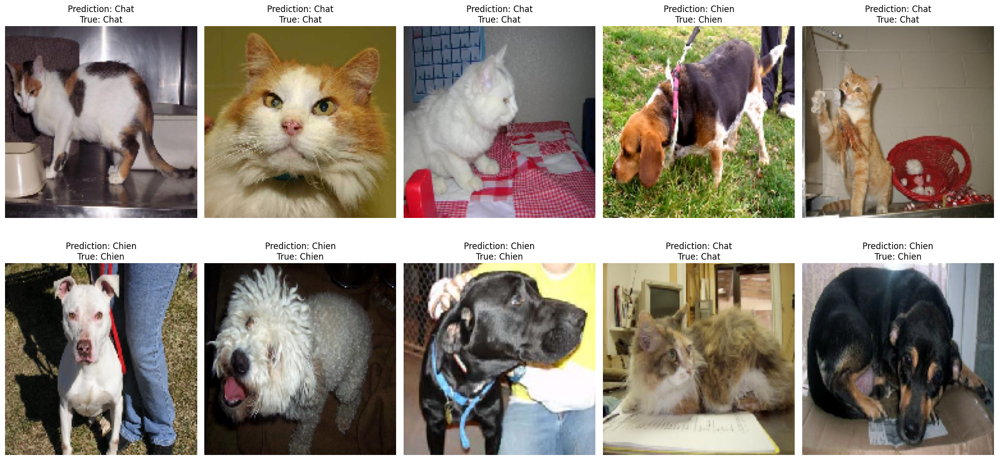

In [72]:
# Sélectionner 10 lignes aléatoires du DataFrame
df_sample = df.sample(n=10)
filenames = df_sample['filename'].tolist()
categories = df_sample['category'].tolist()

# Préparer les images
def prepare_image(file):
    img = load_img(file, target_size=(150, 150))  # Charger l'image et redimensionner
    img_array = img_to_array(img)  # Convertir l'image en tableau numpy
    img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension pour le batch
    img_array /= 255.0  # Normaliser l'image
    return img_array

# Charger et préparer toutes les images
chemins_images = [os.path.join(pet_images_dir,filename)  for filename in filenames]
images = np.vstack([prepare_image(chemin) for chemin in chemins_images])

# Extraire les caractéristiques avec la base convolutionnelle
features = conv_base.predict(images)

# Aplatir les caractéristiques
features_flatten = features.reshape((features.shape[0], 4 * 4 * 512))

# Faire des prédictions
predictions = model.predict(features_flatten)

# Afficher les images et les prédictions
plt.figure(figsize=(20, 10))
for i, (chemin, categorie) in enumerate(zip(chemins_images, categories)):
    img = load_img(chemin, target_size=(150, 150))
    plt.subplot(2, 5, i+1)
    plt.imshow(img)
    pred_label = 'Chien' if predictions[i] > 0.5 else 'Chat'
    vrai_label = 'Chien' if categorie == 1 else 'Chat'
    plt.title(f"Prediction: {pred_label}\nTrue: {vrai_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Feature extration avec data augmentation

In [73]:
# Geler les poids des couches convolutives pour éviter de les entraîner à nouveau
conv_base.trainable = False  # Très important, pour ne pas réentrainer le model les de nv poids

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))


model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 2,097,665 (8.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [74]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=2e-5),
              loss='binary_crossentropy',
              metrics=['accuracy'])  # Compiler le modèle avec l'optimiseur RMSprop et la perte binaire

In [75]:
df_final = selectionner_images_aleatoire(df, n=1500)

# Diviser les données en ensembles d'entraînement et de test
df_train, df_test = train_test_split(df_final, test_size=0.2, random_state=42)

# Afficher la taille des ensembles d'entraînement et de test
print(f"Taille de l'ensemble d'entraînement : {df_train.shape[0]}")
print(f"Taille de l'ensemble de test : {df_test.shape[0]}")


# Génération des données
train_generator, validation_generator = train_val_generator(df_train, df_test)

Taille de l'ensemble d'entraînement : 2400
Taille de l'ensemble de test : 600
Found 2400 validated image filenames belonging to 2 classes.
Found 600 validated image filenames belonging to 2 classes.


In [76]:
# Compiler le modèle avec une perte binaire et un optimiseur RMSprop
model.compile(loss='binary_crossentropy',  # Utiliser la perte binaire cross-entropie
              optimizer=optimizers.RMSprop(learning_rate=2e-5),  # Utiliser l'optimiseur RMSprop avec un taux d'apprentissage réduit
              metrics=['accuracy'])        # Mesurer l'exactitude du modèle

# Entraîner le modèle
history = model.fit(
    train_generator,                        # Utiliser le générateur de données d'entraînement
    steps_per_epoch=50,  # Nombre de pas par époque
    epochs=30,                              # Nombre d'époques d'entraînement
    validation_data=validation_generator   # Utiliser le générateur de données de validation

)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
35/50 ━━━━━━━━━━━━━━━━━━━━ 3s 218ms/step - accuracy: 0.5819 - loss: 0.6727

/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


50/50 ━━━━━━━━━━━━━━━━━━━━ 29s 406ms/step - accuracy: 0.6028 - loss: 0.6604 - val_accuracy: 0.7817 - val_loss: 0.5197
Epoch 2/30
25/50 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - accuracy: 0.7525 - loss: 0.5563

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.7569 - loss: 0.5528 - val_accuracy: 0.8267 - val_loss: 0.4631
Epoch 3/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - accuracy: 0.7739 - loss: 0.5146 - val_accuracy: 0.8550 - val_loss: 0.4048
Epoch 4/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.7864 - loss: 0.4897 - val_accuracy: 0.8400 - val_loss: 0.3886
Epoch 5/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - accuracy: 0.8008 - loss: 0.4708 - val_accuracy: 0.8633 - val_loss: 0.3555
Epoch 6/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - accuracy: 0.8140 - loss: 0.4322 - val_accuracy: 0.8667 - val_loss: 0.3497
Epoch 7/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 250ms/step - accuracy: 0.8052 - loss: 0.4403 - val_accuracy: 0.8800 - val_loss: 0.3337
Epoch 8/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 142ms/step - accuracy: 0.8354 - loss: 0.3989 - val_accuracy: 0.8767 - val_loss: 0.3320
Epoch 9/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 262ms/step - accuracy: 0.8035 - loss: 0.4210 - val_accuracy: 0.8800 - 

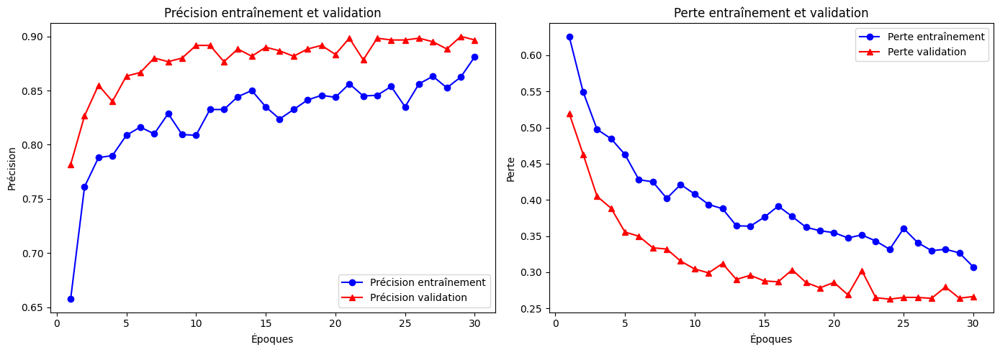

In [81]:
# Plot curves
plot_curves(history)

In [78]:
# Évaluer le modèle sur l'ensemble de validation
loss, accuracy = model.evaluate(validation_generator)
print(f"Validation Accuracy: {accuracy*100:.2f}%")  # Afficher l'exactitude de validation en pourcentage

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.8898 - loss: 0.3014
Validation Accuracy: 89.67%


##### Analyse des performances après Feature Extraction + Data Augmentation 
Lorsqu’on combine la data augmentation à la feature extraction, l’accuracy atteint 89.67%, soit légèrement moins qu’en sans augmentation.
Cela peut s’expliquer par la variabilité introduite par la data augmentation qui, dans ce cas, ne semble pas apporter un gain supplémentaire.
Le modèle reste néanmoins très performant.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


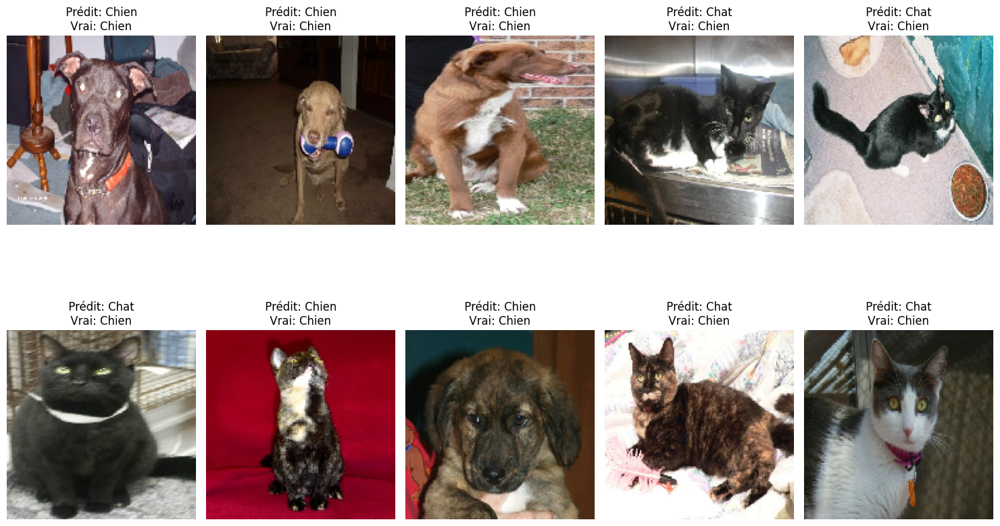

In [79]:
# Prédictions sur 10 images
sample_images = df_test.sample(10).reset_index(drop=True)  # Échantillonner 10 images de validation

plt.figure(figsize=(15, 10))
for i, row in sample_images.iterrows():
    img_path = os.path.join(pet_images_dir, row['filename'])
    img = load_img(img_path, target_size=(150, 150))
    img_tensor = image.img_to_array(img) / 255.0
    img_tensor = np.expand_dims(img_tensor, axis=0)

    prediction = model.predict(img_tensor)
    prediction_label = 'Chien' if prediction[0] > 0.5 else 'Chat'
    vrai_label = 'Chien' if categorie == 1 else 'Chat'

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Prédit: {prediction_label}\nVrai: {vrai_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

## Fine-tuning

In [82]:
# Charger le modèle VGG16 pré-entraîné sans la couche supérieure (include_top=False)
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

Choisir les couches à activer

In [83]:
# Geler toutes les couches sauf celles du bloc5_conv
for layer in conv_base.layers:
    if "block5" in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

# summary
conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 7,079,424 (27.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [84]:
# Ajouter des couches de classification au-dessus du modèle pré-entraîné
model = models.Sequential()                  # Initialiser un modèle séquentiel
model.add(conv_base)                         # Ajouter la base convolutive de VGG16
model.add(layers.Flatten())                  # Aplatir les sorties des convolutions
model.add(layers.Dense(256, activation='relu'))  # Ajouter une couche dense avec 256 unités et activation ReLU
model.add(layers.Dropout(0.5))               # Ajouter une couche de dropout pour réduire le surapprentissage
model.add(layers.Dense(1, activation='sigmoid')) # Ajouter une couche dense avec une unité de sortie et activation sigmoïde

# summary
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 9,177,089 (35.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [86]:
df_final = selectionner_images_aleatoire(df, n=1500)

# Diviser les données en ensembles d'entraînement et de test
df_train, df_test = train_test_split(df_final, test_size=0.2, random_state=42)

# Afficher la taille des ensembles d'entraînement et de test
print(f"Taille de l'ensemble d'entraînement : {df_train.shape[0]}")
print(f"Taille de l'ensemble de test : {df_test.shape[0]}")


# Génération des données
train_generator, validation_generator = train_val_generator(df_train, df_test)

Taille de l'ensemble d'entraînement : 2400
Taille de l'ensemble de test : 600
Found 2400 validated image filenames belonging to 2 classes.
Found 600 validated image filenames belonging to 2 classes.


In [87]:
# Compiler le modèle avec une perte binaire et un optimiseur RMSprop
model.compile(loss='binary_crossentropy',  # Utiliser la perte binaire cross-entropie
              optimizer=optimizers.RMSprop(learning_rate=2e-5),  # Utiliser l'optimiseur RMSprop avec un taux d'apprentissage réduit
              metrics=['accuracy'])        # Mesurer l'exactitude du modèle

# Entraîner le modèle
history = model.fit(
    train_generator,                        # Utiliser le générateur de données d'entraînement
    steps_per_epoch=50,  # Nombre de pas par époque
    epochs=30,                              # Nombre d'époques d'entraînement
    validation_data=validation_generator   # Utiliser le générateur de données de validation

)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
26/50 ━━━━━━━━━━━━━━━━━━━━ 5s 233ms/step - accuracy: 0.5757 - loss: 0.7354

/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:950: UserWarning: Truncated File Read
  warnings.warn(str(msg))


50/50 ━━━━━━━━━━━━━━━━━━━━ 20s 313ms/step - accuracy: 0.6114 - loss: 0.6841 - val_accuracy: 0.8617 - val_loss: 0.3670
Epoch 2/30
25/50 ━━━━━━━━━━━━━━━━━━━━ 5s 229ms/step - accuracy: 0.7646 - loss: 0.4881

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - accuracy: 0.7710 - loss: 0.4784 - val_accuracy: 0.8817 - val_loss: 0.3137
Epoch 3/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 264ms/step - accuracy: 0.7948 - loss: 0.4238 - val_accuracy: 0.8933 - val_loss: 0.2772
Epoch 4/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - accuracy: 0.8412 - loss: 0.3707 - val_accuracy: 0.8850 - val_loss: 0.2756
Epoch 5/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 265ms/step - accuracy: 0.8520 - loss: 0.3551 - val_accuracy: 0.9100 - val_loss: 0.2329
Epoch 6/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - accuracy: 0.8650 - loss: 0.3189 - val_accuracy: 0.9000 - val_loss: 0.2569
Epoch 7/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 13s 261ms/step - accuracy: 0.8667 - loss: 0.3226 - val_accuracy: 0.9250 - val_loss: 0.2059
Epoch 8/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - accuracy: 0.8671 - loss: 0.3068 - val_accuracy: 0.9150 - val_loss: 0.2185
Epoch 9/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 14s 273ms/step - accuracy: 0.8726 - loss: 0.2919 - val_accuracy: 0.9183 - 

In [88]:
# Évaluer le modèle sur l'ensemble de validation
loss, accuracy = model.evaluate(validation_generator)
print(f"Validation Accuracy: {accuracy*100:.2f}%")  # Afficher l'exactitude de validation en pourcentage

19/19 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - accuracy: 0.9519 - loss: 0.1514
Validation Accuracy: 94.33%


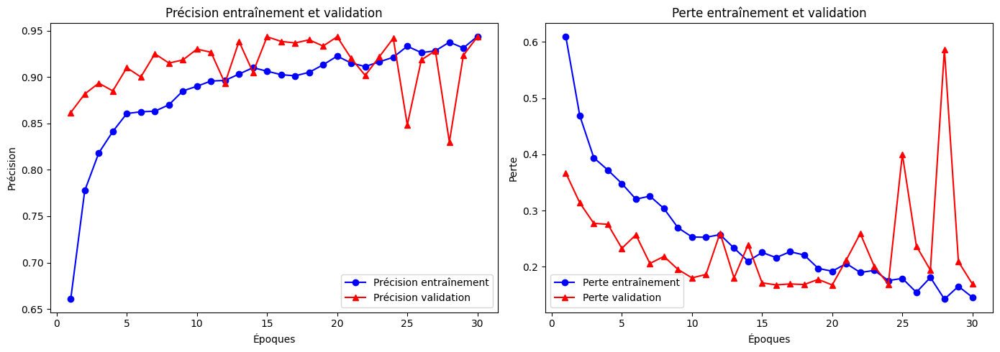

In [89]:
# Curves
plot_curves(history)

#### Analyse des performances après Fine-tuning
En effectuant un fine-tuning (c'est-à-dire en dégelant certaines couches supérieures du modèle VGG16), l’accuracy finale atteint 94.33%.
Cette étape permet d’adapter plus finement les représentations apprises par VGG16 au dataset spécifique de chats et de chiens.
C’est l’approche la plus performante, bien qu’elle soit plus coûteuse en ressources.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 988ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


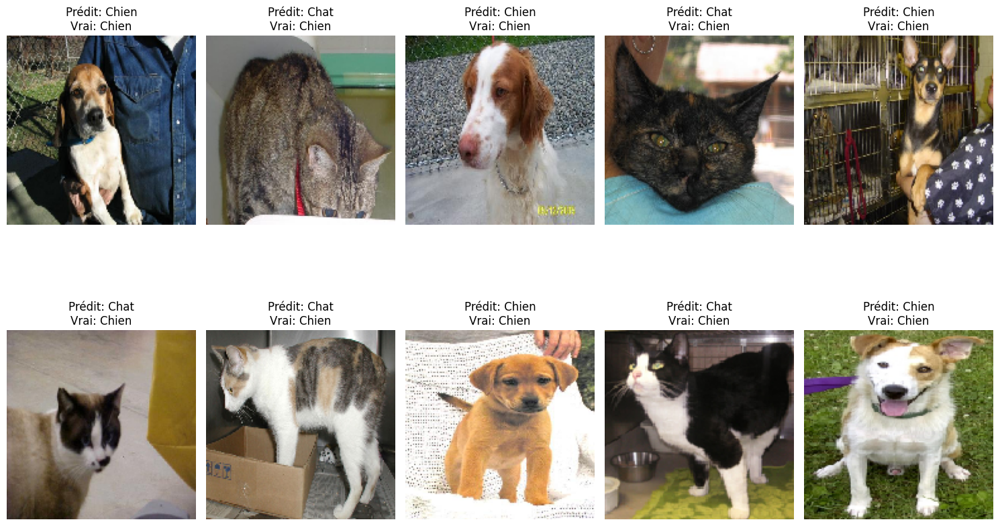

In [90]:
# Prédictions sur 10 images
sample_images = df_test.sample(10).reset_index(drop=True)  # Échantillonner 10 images de validation

plt.figure(figsize=(15, 10))
for i, row in sample_images.iterrows():
    img_path = os.path.join(pet_images_dir, row['filename'])
    img = load_img(img_path, target_size=(150, 150))
    img_tensor = image.img_to_array(img) / 255.0
    img_tensor = np.expand_dims(img_tensor, axis=0)

    prediction = model.predict(img_tensor)
    prediction_label = 'Chien' if prediction[0] > 0.5 else 'Chat'
    vrai_label = 'Chien' if categorie == 1 else 'Chat'

    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Prédit: {prediction_label}\nVrai: {vrai_label}")
    plt.axis('off')

plt.tight_layout()
plt.show()